In [1]:
%load_ext autoreload
%autoreload 2
import torch
import sys

sys.path.append("..")
from src import *

Cupy Available= 1


In [3]:
x = Recording(f"dataset/synthetic/x.tif", max_frames=300, norm=True).np
y = Recording(f"dataset/synthetic/deepcad_15.tif", max_frames=300, norm=True).np

In [8]:
X=np.abs(np.fft.rfft(x, axis=0))
Y=np.abs(np.fft.rfft(y, axis=0))

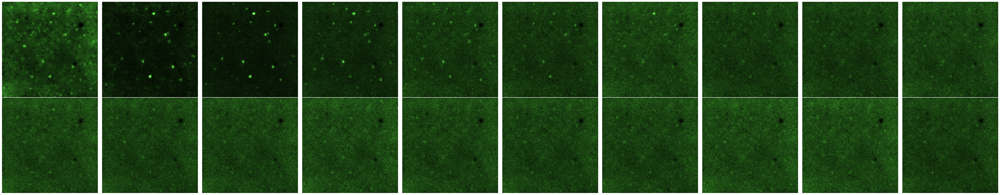

In [26]:
imshow([x for x in X[:20]], size=5, dpi=100)

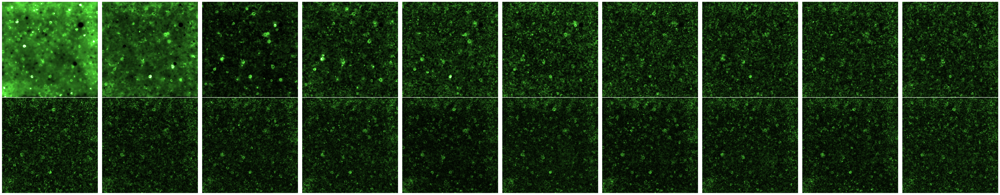

In [29]:
imshow([y for y in Y[:20]], size=5, dpi=100)

In [53]:
def match(src, trg):
    low = np.quantile(src.flatten(), 0.25)
    high = np.quantile(src.flatten(), 0.75)
    t_low = np.quantile(trg.flatten(), 0.25)
    t_high = np.quantile(trg.flatten(), 0.75)
    denom = np.clip(high - low, min=1e-6)
    a = (t_high - t_low) / denom
    b = t_low - a * low
    return np.clip(a * src + b, 0, 1)

<Axes: >

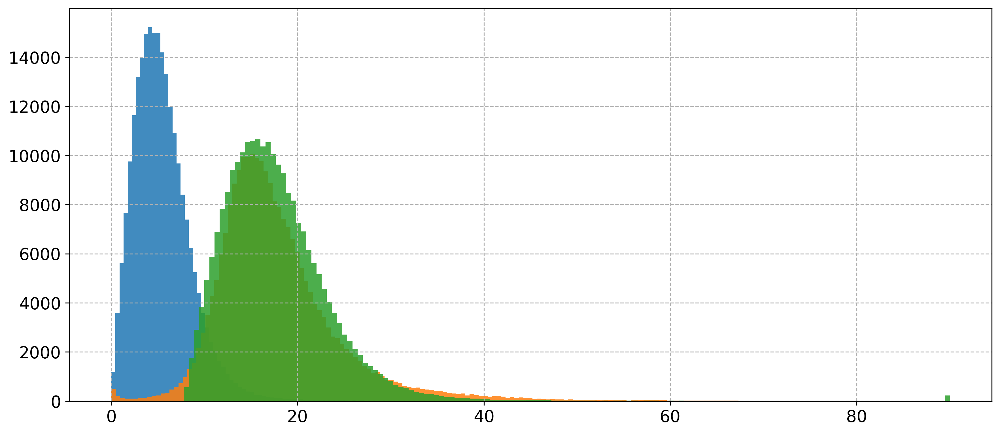

In [89]:
fig = plt.figure(figsize=(14, 6), dpi=300)
ax = pd.Series(X[1].ravel()).hist(bins=150, alpha=0.85)
pd.Series(Y[1].ravel()).hist(ax=ax, bins=150, alpha=0.85)
pd.Series((match(X[1],Y[1]/90)*90).ravel()).hist(ax=ax, bins=150, alpha=0.85)